# Aprendizaje Automático, Cuestionario 1

Morales Polanco, Diego Enrique

Fecha de entrega: 3 de Diciembre de 2023

En este cuestionario se espera que el alumno profundice en algunos aspectos de la implementación de los árboles de decisión que no se han visto en clase. <br>
Se espera que el alumno presente el mejor análisis posible dependiendo de su formación básica y de su experiencia con sistemas de aprendizaje automático. <br>

Para ello, cada alumno debe elegir una base de datos del repositorio de la Universidad de California (accesible en https://archive.ics.uci.edu/) y realizar
sobre él el siguiente estudio.

## 1. Reproducir los pasos que se han visto en clase sobre el conjunto iris, en particular:

### a. Carga del fichero en python y probablemente, gestionar las instancias con datos incompletos. Se sugiere mirar la documentación de la librería pandas.

La base de datos elegida fue "Adult", también llamada "Census Income". El objetivo de esta base de datos es utilizar un conjunto de datos reportados por el proceso de censo Americano para predecir 
si los ingresos anuales de una persona dada superan los 50 mil dolares americanos. A continuación se importa la base de datos según lo indicado en el repositorio

In [1]:
from sklearn.tree import DecisionTreeClassifier, export_text, export_graphviz, plot_tree
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn import linear_model
from sklearn import metrics as skm
import time

from ucimlrepo import fetch_ucirepo 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
  
# traer el dataset
adult = fetch_ucirepo(id=2) 

# data (as pandas dataframes) 
X = pd.DataFrame(adult.data.features)
y = pd.DataFrame(adult.data.targets)
  
# metadata 
print(adult.metadata) 
#print(adult.abstract)
  
# variable information 
#print(type(y["income"][0]))
print(adult.variables) 

{'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether income exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Mon Aug 07 2023', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': 'Extraction was done by Barry Becker from the 1994 Census database.  A set of reasonably clean records was extracted using the following conditions: ((AAG

Se empieza visualizando un poco de la data para ver los atributos que tiene. Se concatenarán los dos dataframes importados con el fin de visualizarlos a la vez.

In [2]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)
df = pd.concat([X,y],axis=1)
df.head(40)


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K


Según la documentación del dataset en la página de la UCI (https://archive.ics.uci.edu/dataset/2/adult), este dataset contiene datos incompletos en las columnas de "workclass", "occupation" y "native country". En la visualización
anterior se puede observar algunos valores marcados como "?" en las columnas "workclass", "occupation" y "native country". Debido a que los valores incompletos pertenecen a variables categóricas, en primera instancia y por simplicidad se utilizará la moda de cada columna para llenar los datos faltantes. A continuación usamos el método isnull de pandas para observar la cantidad de valores faltantes de cada columna.

In [3]:
X.isnull().sum()

age                 0
workclass         963
fnlwgt              0
education           0
education-num       0
marital-status      0
occupation        966
relationship        0
race                0
sex                 0
capital-gain        0
capital-loss        0
hours-per-week      0
native-country    274
dtype: int64

Es importante notar que el string "?" no es reconocido como null por pandas, asi que es necesario transformar todos estos valores a NaN. Se notará que la suma de los valores NaN luego de hacer esto aumenta.

In [4]:
X[X == '?'] = np.nan
X.isnull().sum()

age                  0
workclass         2799
fnlwgt               0
education            0
education-num        0
marital-status       0
occupation        2809
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     857
dtype: int64

Ahora se reemplazan los valores NaN de las columnas "workclass", "occupation" y "native country" por la categoría moda de su respectiva columna. Se imprime el valor de la moda para observar cual es la categoría que más se repite de cada columna. Se vuelve a usar la función isnull().sum() para confirmar que no queda data faltante en el dataset.

In [5]:
for col in ['workclass', 'occupation', 'native-country']:
    X[col].fillna(X[col].mode()[0], inplace=True)
    print(X[col].mode()[0])

X.isnull().sum()

Private
Prof-specialty
United-States


age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
dtype: int64

### b.  Realiza un pequeño examen exploratorio creando la scatter matrix y el mapa de calor (heatmap) de los coeficientes de correlación de Pearson entre las variables.

Al intentar realizar el scatter matrix, se pudo observar que la función scatter_matrix daba el siguiente error "'c' argument must be a color, a sequence of colors, or a sequence of numbers", esto se debe a que el valor de y son strings de la forma "<=50K" o ">50K", por lo que se debe mapear cada categoría a un valor numérico. Al intentar hacer esto, se pudo observar que algunos valores resultaban en NaN, lo que significa que en el dataframe hay categorias distintas a las mencionadas, para verificar esto se puede utilizar la función "unique" y "stack" de pandas.

In [6]:
categories = y["income"].unique()
category_counts = y["income"].value_counts()
print(categories)
print(category_counts)

['<=50K' '>50K' '<=50K.' '>50K.']
income
<=50K     24720
<=50K.    12435
>50K       7841
>50K.      3846
Name: count, dtype: int64


Se puede apreciar que en el dataframe target hay datos con los valores '<=50K', '>50K', '<=50K.', '>50K.', el punto al final de estos strings se considera un error de digitación. Para evitar que esto afecte el modelo, se mapeara al mismo valor numérico la versión del string con el punto al que la versión del string sin el punto es mappeado.

In [7]:
category_mapping = {"<=50K": 0, "<=50K.": 0, ">50K": 1, ">50K.": 1}
y["income"] = y["income"].map(category_mapping)

Se vuelven a verificar los valores únicos de la columna target. La suma de los valores que eran "<=50K" más los valores que eran "<=50K." debe ser igual a la cantidad de 0 que hay en la columna target, lo mismo es cierto para la otra categoría.

In [8]:
categories = y["income"].unique()
category_counts = y["income"].value_counts()
print(categories)
print(category_counts)

[0 1]
income
0    37155
1    11687
Name: count, dtype: int64


Se realizó el mismo análisis para las demas variables categóricas "workclass","education","marital-status","occupation","relationship","race","sex", "native-country". No se encontraron errores como el visto en "income". Se realizará el mapeo de las demas variables categóricas, utilizando el tipo de dato "category", el método astype y los parámetros cat.codes de pandas.

In [9]:
categorical_variables = ["workclass","education","marital-status","occupation","relationship","race","sex", "native-country"]

for category in categorical_variables:
    X[category] = X[category].astype("category").cat.codes

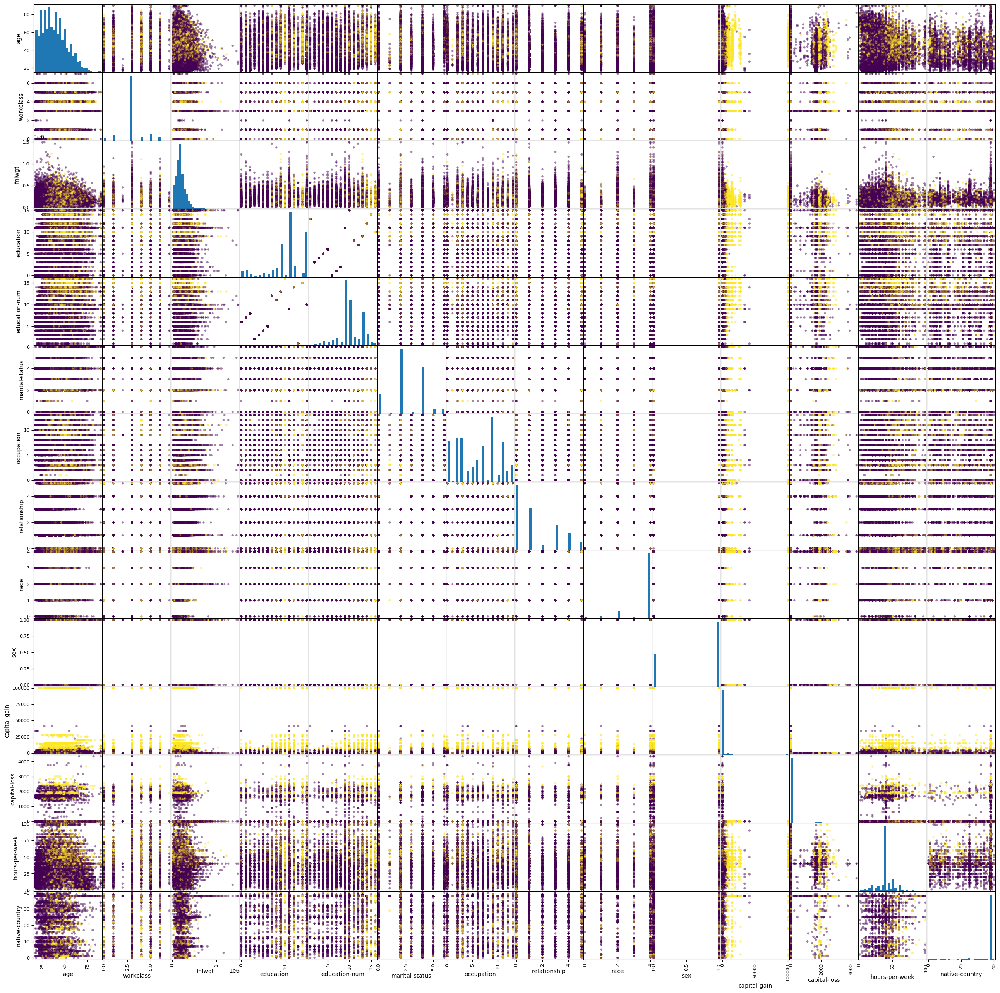

In [10]:
sp = pd.plotting.scatter_matrix(X, c=y["income"], figsize=(30, 30),
                                 hist_kwds={'bins': 30}, s=60, alpha=.5)

Los puntos morados corresponden a las personas que ganan menos de 50K dolares al año y los amarillos a los que ganan más. Se puede apreciar que la variable capital gain presenta una discriminación relativamente clara entre las clases, principalmente comparada con la variable education, age, native-country y hours-per-week. A continuación se crea el mapa de calor de los coeficientes de Pearson. 

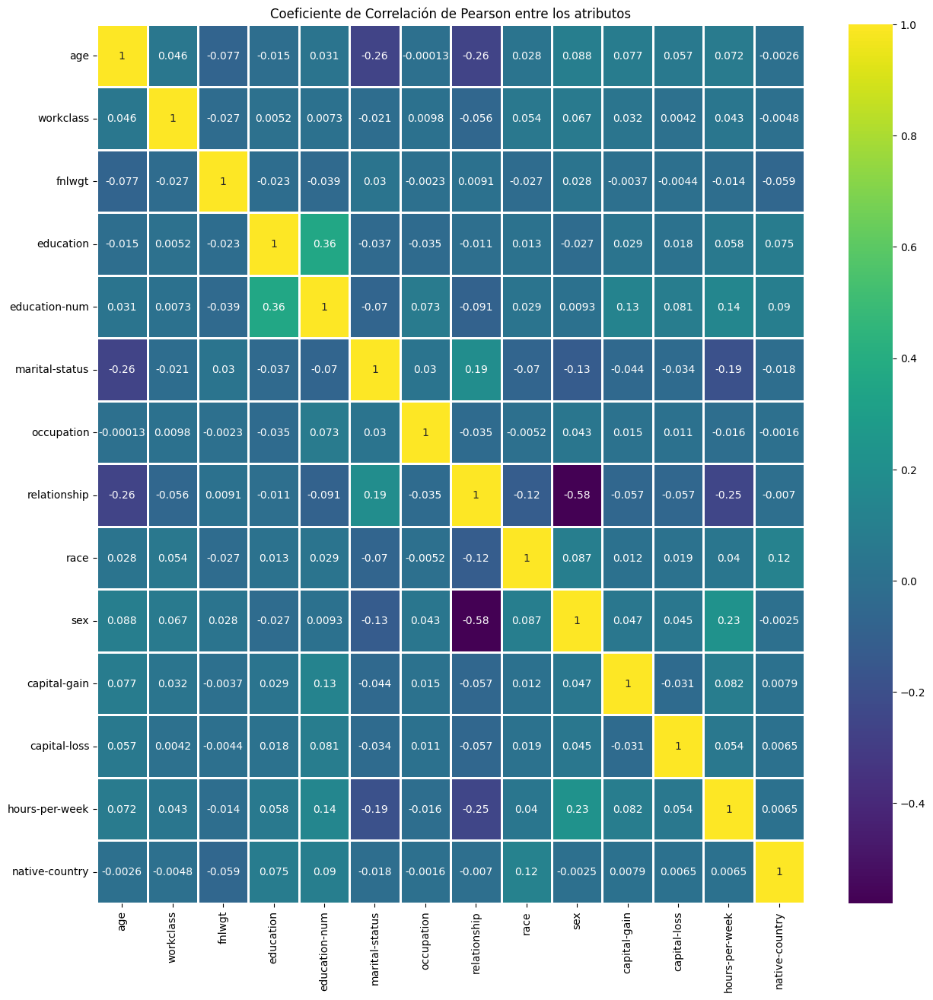

In [11]:
plt.figure(figsize=(15,15))
plt.title('Coeficiente de Correlación de Pearson entre los atributos')
sns.heatmap(X.corr(),linewidths=1, cmap='viridis', linecolor='white', annot=True)
plt.show()

Se puede apreciar que no hay mucha correlación entre las variables. Las variables que más se correlacionan son "relación" y "sexo". Esto se debe a que "relación" tiene las categorias "esposo" y "esposa" (entre otras), las cuales están directamente relacionadas con el sexo. 

### c.  Divide la base de datos en conjunto de entrenamiento y prueba y crea el correspondiente árbol de decisión sobre el conjunto de entrenamiento.

Al igual que en la práctica vista en clase, se procede a dividir el dataset en conjunto de entrenamiento y prueba. No se necesita otra modificación a la data ya que scikit learn acepta dataframes de pandas como parámetros para la función train_test_split y la función fit. (https://scikit-learn.org/stable/faq.html#:~:text=Generally%2C%20scikit-learn%20works%20on,pandas%20DataFrame%20are%20also%20acceptable.)

In [12]:
X_train, X_test, y_train, y_test = \
  train_test_split(X,y,test_size = 0.25,random_state=462)

Luego se crea el árbol y se entrena con el conjunto de entrenamiento.

In [13]:
tree3_clf = DecisionTreeClassifier(random_state=10)
tree3_clf.fit(X_train,y_train)

DecisionTreeClassifier(random_state=10)

### d.  Representa gráficamente el árbol obtenido.

In [14]:
export_graphviz(
    tree3_clf,
    out_file="census.dot",
    feature_names=X.columns.tolist(),
    rounded=True,
    filled=True)

In [15]:
!dot -Tpng census.dot -o census.png

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.159979 to fit


In [16]:
plt.clf()
image = plt.imread("census.png")
height, width, depth = image.shape
dpi = 70
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize).add_axes([0, 0, 1, 1])
plt.axis('off')
plt.imshow(image)
plt.show()

<Figure size 640x480 with 0 Axes>

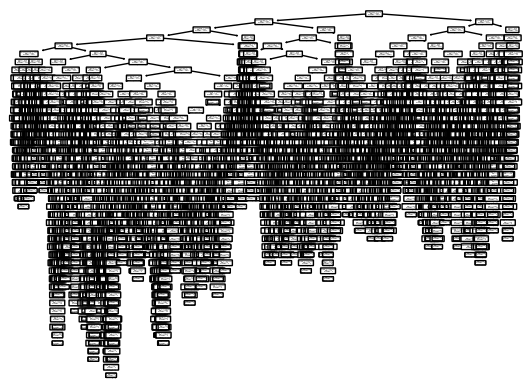

In [17]:
plot_tree(tree3_clf,rounded=True,feature_names=X.columns.tolist())
plt.show()

Se puede apreciar que el árbol resultante sin limitar la profundidad es demasiado grande para poder ser visualizado de una manera que se pueda interpretar. Se jugará con los parámetros más adelante para intentar conseguir un árbol más interpretable.

### e.  Encuentra la medida de rendimiento (score) del árbol sobre los conjuntos de entrenamiento, prueba y total.

In [18]:
pred3 = tree3_clf.predict(X_test)
pred3

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [19]:
y_test["income"]

26521    0
39765    0
29665    0
4731     0
23208    0
        ..
31904    0
25989    1
24160    1
47197    0
26431    0
Name: income, Length: 12211, dtype: int64

In [20]:
print("Rendimiento en el conjunto de entrenamiento: ",tree3_clf.score(X_train,y_train))
print("Rendimiento en el conjunto de prueba: ",tree3_clf.score(X_test,y_test))
print("Rendimiento en el conjunto total: ",tree3_clf.score(X,y))

Rendimiento en el conjunto de entrenamiento:  0.9998908028718845
Rendimiento en el conjunto de prueba:  0.8130374252722955
Rendimiento en el conjunto total:  0.9531755456369518


También podemos graficar la matriz de confusión.

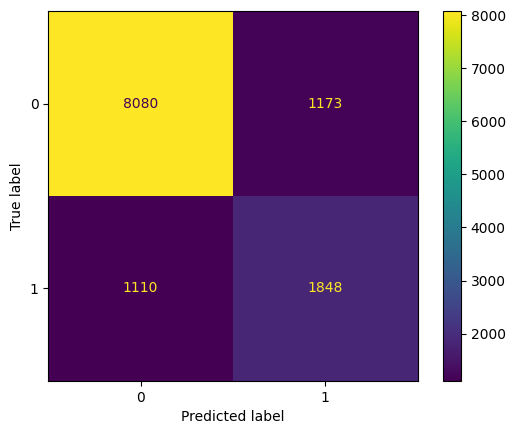

In [21]:
cm = skm.confusion_matrix(y_test, pred3, labels=tree3_clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree3_clf.classes_)
disp.plot()
plt.grid(False)
plt.show()

### Fine Tuning

Introduciendo cross validation

In [22]:
cross_validation = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 357 )
scores = cross_val_score(tree3_clf, X_train, y_train, 
                                 scoring = "accuracy", cv = cross_validation, n_jobs = 1 )
scores

array([0.8125    , 0.81217581, 0.80616981, 0.81244881, 0.81326781,
       0.81572482, 0.81354081, 0.82036582, 0.81681682, 0.81326781])

In [23]:
print( "Rendimiento: Valor medio %0.5f y desviación típica %0.5f)" % (scores.mean(), scores.std()))

Rendimiento: Valor medio 0.81363 y desviación típica 0.00347)


Vemos que el rendimiento del modelo es fiable a traves de distintos subconjuntos de data, debido a que la desviación típica es relativamente baja. A continuación se realizará el mismo estudio realizado en clase para encontrar un valor óptimo para el parámetro "min_samples_split".

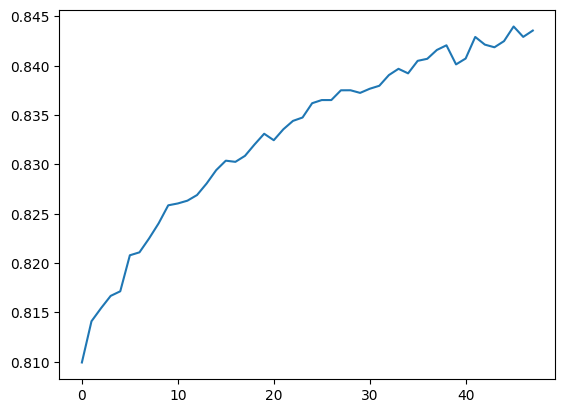

In [24]:
num_tam = 50
iteraciones = 20
means = []

for i in range(2,num_tam):
    val = 0
    for _ in range(iteraciones):
        x_train_aux, x_test_aux, y_train_aux, y_test_aux = train_test_split(X, y, test_size=0.50)
        tree_aux = DecisionTreeClassifier(min_samples_split=i)
        tree_aux.fit(x_train_aux, y_train_aux)
        val += skm.accuracy_score(y_test_aux, tree_aux.predict(x_test_aux))
    m = val / iteraciones
    means.append(m)
    
plt.plot(means)
plt.show()

Se puede observar que, a diferencia del ejemplo visto en clase, el score tiende a seguir aumentando más alla del valor 50, lo cuál hace sentido debido a la gran cantidad de datos con la que se está trabajando, esto puede indicar que el árbol tenía cierta cantidad de overfitting. Se hará el estudio hasta 200 para divisar un rango en que el valor óptimo para este parámetro se pueda encontrar.

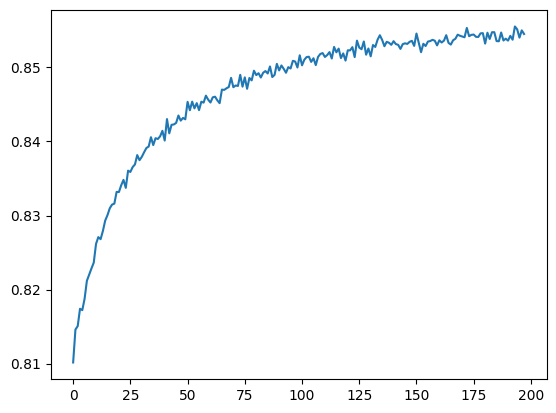

In [30]:
num_tam = 200
iteraciones = 20
means = []

for i in range(2,num_tam):
    val = 0
    for _ in range(iteraciones):
        x_train_aux, x_test_aux, y_train_aux, y_test_aux = train_test_split(X, y, test_size=0.50)
        tree_aux = DecisionTreeClassifier(min_samples_split=i)
        tree_aux.fit(x_train_aux, y_train_aux)
        val += skm.accuracy_score(y_test_aux, tree_aux.predict(x_test_aux))
    m = val / iteraciones
    means.append(m)
    
plt.plot(means)
plt.show()

Vemos que el rendimiento aumenta bastante rápido en valores de 0 a 100, para luego estabilizarse en valores de 100 en adelante, lo que significa que puede ser útil buscar árboles con valores entre 100 y 500 del parámetro "min_samples_split". Se procederá a hacer el mismo estudio con los demás parámetros que controlan la profundidad del árbol. 

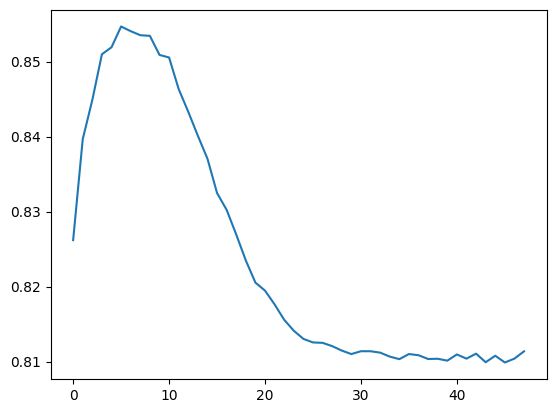

In [26]:
# Para la profundidad máxima

num_tam = 50
iteraciones = 20
means = []

for i in range(2,num_tam):
    val = 0
    for _ in range(iteraciones):
        x_train_aux, x_test_aux, y_train_aux, y_test_aux = train_test_split(X, y, test_size=0.50)
        tree_aux = DecisionTreeClassifier(max_depth=i)
        tree_aux.fit(x_train_aux, y_train_aux)
        val += skm.accuracy_score(y_test_aux, tree_aux.predict(x_test_aux))
    m = val / iteraciones
    means.append(m)
    
plt.plot(means)
plt.show()

Vemos que una profundidad máxima entre 0 y 10 da los mejores resultados, asi podemos tener un árbol más interpretable que el que originalmente se obtuvo en el acápite d.

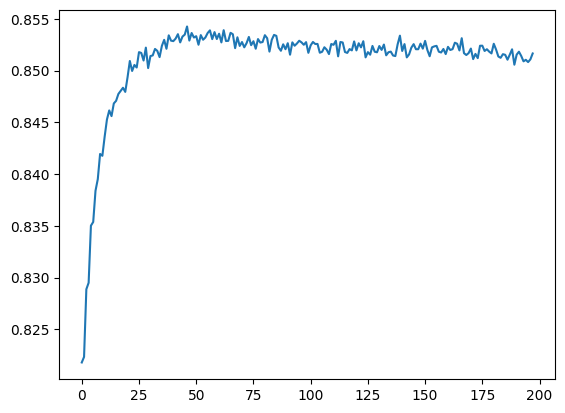

In [27]:
# Para min_samples_leaf

num_tam = 200
iteraciones = 20
means = []

for i in range(2,num_tam):
    val = 0
    for _ in range(iteraciones):
        x_train_aux, x_test_aux, y_train_aux, y_test_aux = train_test_split(X, y, test_size=0.50)
        tree_aux = DecisionTreeClassifier(min_samples_leaf=i)
        tree_aux.fit(x_train_aux, y_train_aux)
        val += skm.accuracy_score(y_test_aux, tree_aux.predict(x_test_aux))
    m = val / iteraciones
    means.append(m)
    
plt.plot(means)
plt.show()

Al igual que para min_samples_split, se puede observar que para min_samples_leaf el score del árbol incrementa considerablemente de 0 a 100, y luego se mantiene relativamente constante.

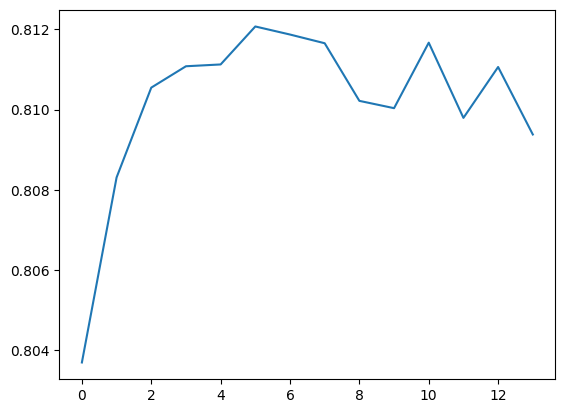

In [28]:
# Para max features 

num_tam = 15
iteraciones = 20
means = []

for i in range(1,num_tam):
    val = 0
    for _ in range(iteraciones):
        x_train_aux, x_test_aux, y_train_aux, y_test_aux = train_test_split(X, y, test_size=0.50)
        tree_aux = DecisionTreeClassifier(max_features=i)
        tree_aux.fit(x_train_aux, y_train_aux)
        val += skm.accuracy_score(y_test_aux, tree_aux.predict(x_test_aux))
    m = val / iteraciones
    means.append(m)
    
plt.plot(means)
plt.show()

Se corre el estudio para max features de 0 a 15 ya que el dataset con el que estamos trabajando tiene solo 14 features. Se puede observar que consigue los mejores valores tomando en cuenta de 1 a 7 features.

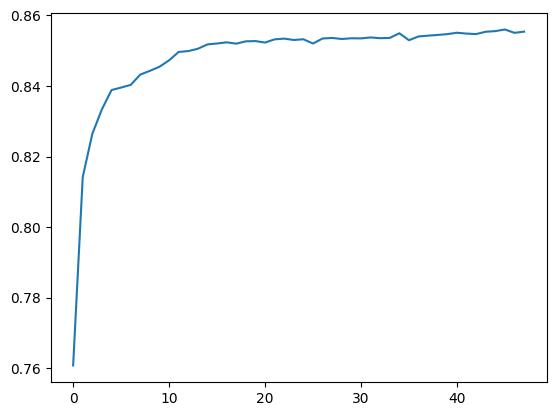

In [29]:
# Para max leaf nodes

num_tam = 50
iteraciones = 20
means = []

for i in range(2,num_tam):
    val = 0
    for _ in range(iteraciones):
        x_train_aux, x_test_aux, y_train_aux, y_test_aux = train_test_split(X, y, test_size=0.50)
        tree_aux = DecisionTreeClassifier(max_leaf_nodes=i)
        tree_aux.fit(x_train_aux, y_train_aux)
        val += skm.accuracy_score(y_test_aux, tree_aux.predict(x_test_aux))
    m = val / iteraciones
    means.append(m)
    
plt.plot(means)
plt.show()

Se puede observar el mismo comportamiento en max leaf nodes que en min_samples_split y min_samples_leaf.

En base a los rangos con mejor comportamiento que se vieron en las gráficas anteriores, podemos realizar el experimento de fine tuning con GridSearch y encontrar la mejor combinación de parámetros para el árbol. Debido a la gran cantidad de datos del dataset, se utilizara random grid search en lugar del grid search exhaustivo. Según la documentación de scikit learn, el random grid search (https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html#sklearn.model_selection.RandomizedSearchCV) puede disminuir drasticamente el tiempo de ejecución, sin afectar considerablemente el rendimiento. (https://scikit-learn.org/stable/auto_examples/model_selection/plot_randomized_search.html). La busqueda exhaustiva estaba tomando demasiado tiempo de ejecución y recursos.

In [31]:
from sklearn.model_selection import RandomizedSearchCV
t_start = time.time()
parameters = {
    'criterion':['gini', 'entropy',"log_loss"],     # luego de ver la documentación en scikit-learn se añadió log_loss a los criterios a probar
    'splitter':['best','random'],                   # luego de ver la documentación en scikit-learn se añadió el splitter, este parámetro no se tomo en cuenta en clase y se quiere observar el efecto de este parámetro
    'max_depth':[None, 5, 8, 10],
    'max_features':[None, 'sqrt', 'log2', 3], # se añadió el valor None, el cual según la documentación defaultea al máximo número de features
    'max_leaf_nodes':[None, 25, 60, 80],
    'min_impurity_decrease':[0.0, 0.001, 0.01],
    'min_samples_leaf':[100, 150, 300, 400],
    'min_samples_split':[100, 300, 400, 700]
}

clf = RandomizedSearchCV(DecisionTreeClassifier(random_state=42), parameters, cv=10, scoring='accuracy')

clf.fit(X, y)

print('Se ha tardado {:.2f}s'.format(time.time() - t_start))
print('Mejores hiperparámetros encontrados:', clf.best_params_)

Se ha tardado 2.54s
Mejores hiperparámetros encontrados: {'splitter': 'best', 'min_samples_split': 700, 'min_samples_leaf': 300, 'min_impurity_decrease': 0.01, 'max_leaf_nodes': 80, 'max_features': None, 'max_depth': 10, 'criterion': 'log_loss'}


Procederemos a crear el árbol final con los parámetros encontrados, entrenarlo, graficarlo y calcular su rendimiento.

In [32]:
final_tree = DecisionTreeClassifier(splitter= 'best', min_samples_split=700, min_samples_leaf=300, min_impurity_decrease=0.01, max_leaf_nodes= None, max_features= None, max_depth= 10, 
                                    criterion= 'log_loss', random_state=843)
final_tree.fit(X_train,y_train)


DecisionTreeClassifier(criterion='log_loss', max_depth=10,
                       min_impurity_decrease=0.01, min_samples_leaf=300,
                       min_samples_split=700, random_state=843)

In [33]:
export_graphviz(
    final_tree,
    out_file="census_tuned.dot",
    feature_names=X.columns.tolist(),
    rounded=True,
    filled=True)

In [34]:
!dot -Tpng census_tuned.dot -o census_tuned.png

<Figure size 640x480 with 0 Axes>

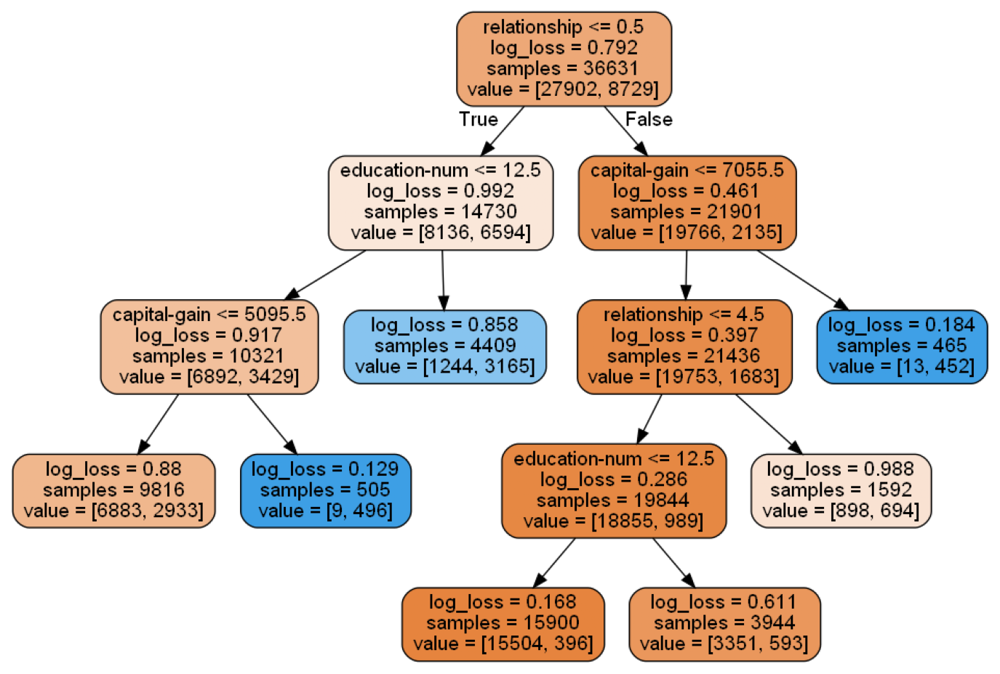

In [35]:
plt.clf()
image = plt.imread("census_tuned.png")
height, width, depth = image.shape
dpi = 70
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize).add_axes([0, 0, 1, 1])
plt.axis('off')
plt.imshow(image)
plt.show()

In [36]:
print('### Matrices de confusión ###\n')
print('Entrenamiento:')
print(skm.confusion_matrix(y_train, final_tree.predict(X_train)))
print('\nPruebas:')
print(skm.confusion_matrix(y_test, final_tree.predict(X_test)))

### Matrices de confusión ###

Entrenamiento:
[[26636  1266]
 [ 4616  4113]]

Pruebas:
[[8836  417]
 [1535 1423]]


In [37]:
print("Rendimiento en el conjunto de entrenamiento: ",final_tree.score(X_train,y_train))
print("Rendimiento en el conjunto de prueba: ",final_tree.score(X_test,y_test))
print("Rendimiento en el conjunto total: ",final_tree.score(X,y))

Rendimiento en el conjunto de entrenamiento:  0.8394256231061124
Rendimiento en el conjunto de prueba:  0.8401441323396938
Rendimiento en el conjunto total:  0.8396052577699521


## 2 La parte realmente interesante de este cuestionario empieza ahora, donde se espera que el alumno demuestre su autonomía y capacidad de profundización en la materia a partir de los conceptos básicos. Se espera que el alumno continúe con el análisis del conjunto de datos y presente el estudio más completo posible.

La primera profundización propuesta es un análisis más profundo de la data, diferente al sugerido en clase, con el fin de tener un mejor entendimiento de cada variable. Como se está trabajando con variables categóricas y numéricas, las mismas gráficas utilizadas en clase pueden no ser las mejores para visualizar el significado y las relaciones entre la data. La documentación de seaborn (https://seaborn.pydata.org/tutorial/categorical.html), propone distintas gráficas que pueden ser utilizadas para tratar con variables categóricas. Una buena primera visualización es ver la distribución de las clases que se quieren clasificar en nuestro dataset.

In [38]:
# Reimportamos la data
X = pd.DataFrame(adult.data.features)
y = pd.DataFrame(adult.data.targets)

# Lidiamos con los valores NaN
X[X == '?'] = np.nan

for col in ['workclass', 'occupation', 'native-country']:
    X[col].fillna(X[col].mode()[0], inplace=True)

# Mapeamos los strings con punto a la categoria correcta
category_mapping = {"<=50K": "<=50K", "<=50K.": "<=50K", ">50K": ">50K", ">50K.": ">50K"}
y["income"] = y["income"].map(category_mapping)

C:\Users\diego\AppData\Local\Temp\ipykernel_39924\3549815446.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = 'Ingresos', y = 'Porcentaje', data = porcentaje, palette='Greens_r')


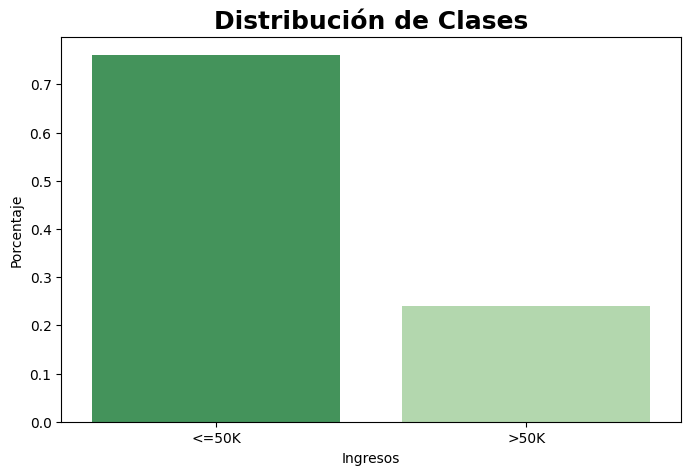

In [39]:
plt.figure(figsize = (8,5))
plt.title('Distribución de Clases', fontsize=18, fontweight='bold')
porcentaje = y['income'].value_counts(normalize = True).rename_axis('Ingresos').reset_index(name = 'Porcentaje')

ax = sns.barplot(x = 'Ingresos', y = 'Porcentaje', data = porcentaje, palette='Greens_r')


Se puede apreciar que más de un 70% de las muestras de nuestro dataset corresponden a la clase que gana menos de 50K dolares al año, este imbalance entre la data puede ocasionar que el árbol este sesgado hacia la clase con más muestras. Para verificar esto podemos revisar la matriz de confusión de nuestro último árbol.

<Figure size 640x480 with 0 Axes>

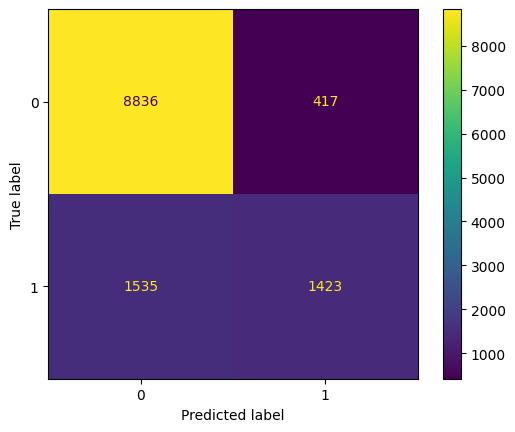

In [40]:
plt.clf()
pred3 = final_tree.predict(X_test)
cm = skm.confusion_matrix(y_test, pred3, labels=final_tree.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=final_tree.classes_)
disp.plot()
plt.grid(False)
plt.show()

Como se puede apreciar el árbol es muy bueno prediciendo los casos negativos, pero para los casos positivos su predicción es mucho peor. Esto puede deberse a la distribución imbalanceada de las clases vista anteriormente.

Para lidiar con esto se puede utilizar técnicas de "undersampling" o "oversampling" (https://www.mastersindatascience.org/learning/statistics-data-science/undersampling/). El undersampling consiste en tomar menos muestras de la clase más abundante, tal que la proporción sea más equitativa y el oversampling consiste en crear muestras artificiales de la clase minoritaria para que la proporción sea más equitativa. Debido a que el dataset ya es de un tamaño considerable, se probará con undersampling en primera instancia. Hay muchas técnicas de undersampling, la gran mayoría involucra algoritmos de machine learning que no se han visto en clase como el KNN. Para mantener la simplicidad, se utilizará un undersampling aleatorio. 

In [41]:
df = pd.concat([X,y],axis=1)                        # Se concatenan ambos datasets
category_mapping = {"<=50K": 0, ">50K": 1}
df["income"] = df["income"].map(category_mapping)      # Se mapean los valores target

# sampleo aleatorio
casos_positivos = df[df['income']==1]
casos_negativos = df[df['income']==0]
casos_negativos = casos_negativos.sample(n=len(casos_positivos), random_state=101)
df = pd.concat([casos_positivos,casos_negativos],axis=0)

Ahora se tiene un dataframe con una distribución equitativa de las clases, pero con mucho menos puntos de data. Este es uno de los posibles efectos negativos de el undersampling, puede que al disminuir la data, el modelo aprende menos de la clase que fue undersampleada (en nuestro caso la negativa), disminuyendo el rendimiento general pero eliminando el sesgo por el imbalance.

Tamaño del dataset original:  48842
Tamaño del dataset undersampleado:  23374


C:\Users\diego\AppData\Local\Temp\ipykernel_39924\1639374628.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = 'Ingresos', y = 'Porcentaje', data = porcentaje, palette='Greens_r')


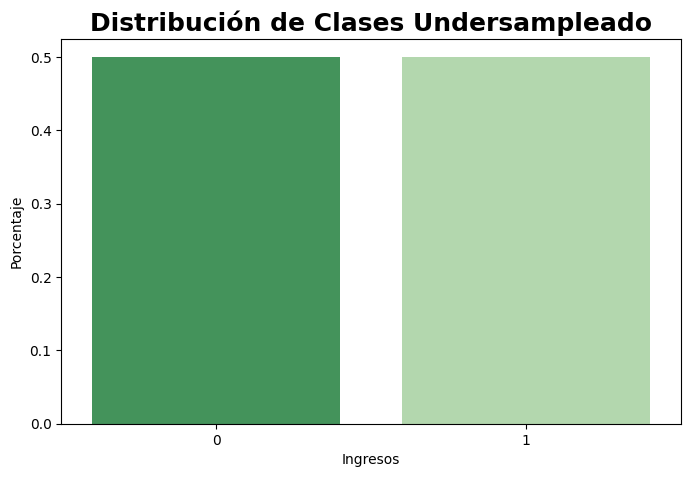

In [42]:
plt.figure(figsize = (8,5))
plt.title('Distribución de Clases Undersampleado', fontsize=18, fontweight='bold')
porcentaje = df['income'].value_counts(normalize = True).rename_axis('Ingresos').reset_index(name = 'Porcentaje')

ax = sns.barplot(x = 'Ingresos', y = 'Porcentaje', data = porcentaje, palette='Greens_r')
print("Tamaño del dataset original: ",len(X))
print("Tamaño del dataset undersampleado: ",len(df))


Se crean los dataframes X y y.

In [43]:
y = df['income'].copy()
X = df[df.columns[:-1]].copy()

# Se mapean las variables categoricas a un código numérico como se hizo anteriormente
categorical_variables = ["workclass","education","marital-status","occupation","relationship","race","sex", "native-country"]

for category in categorical_variables:
    X[category] = X[category].astype("category").cat.codes

# Se crean los conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = \
  train_test_split(X,y,test_size = 0.25,random_state=462)

Se vuelven a encontrar los hiperparámetros óptimos con el random grid search y la nueva data undersampleada.

In [47]:
t_start = time.time()
parameters = {
    'criterion':['gini', 'entropy',"log_loss"],     # luego de ver la documentación en scikit-learn se añadió log_loss a los criterios a probar
    'splitter':['best','random'],                   # luego de ver la documentación en scikit-learn se añadió el splitter, este parámetro no se tomo en cuenta en clase y se quiere observar el efecto de este parámetro
    'max_depth':[None, 5, 8, 10],
    'max_features':[None, 'sqrt', 'log2', 3], # se añadió el valor None, el cual según la documentación defaultea al máximo número de features
    'max_leaf_nodes':[None, 25, 60, 80],
    'min_impurity_decrease':[0.0, 0.001, 0.01],
    'min_samples_leaf':[100, 150, 300, 400],
    'min_samples_split':[100, 300, 400, 700]
}

clf = RandomizedSearchCV(DecisionTreeClassifier(random_state=42), parameters, cv=10, scoring='accuracy')

clf.fit(X, y)

print('Se ha tardado {:.2f}s'.format(time.time() - t_start))
print('Mejores hiperparámetros encontrados:', clf.best_params_)

Se ha tardado 1.08s
Mejores hiperparámetros encontrados: {'splitter': 'best', 'min_samples_split': 400, 'min_samples_leaf': 150, 'min_impurity_decrease': 0.0, 'max_leaf_nodes': None, 'max_features': 'log2', 'max_depth': None, 'criterion': 'gini'}


Se entrena el árbol con los parámetros óptimos encontrados.

In [48]:
undersampled_tree = DecisionTreeClassifier(splitter= 'best', min_samples_split=400, min_samples_leaf=150, min_impurity_decrease=0.0, max_leaf_nodes= None, max_features= 'log2', max_depth= None, 
                                    criterion= 'gini', random_state=843)
undersampled_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_features='log2', min_samples_leaf=150,
                       min_samples_split=400, random_state=843)

In [52]:
export_graphviz(
    undersampled_tree,
    out_file="census_undersampled.dot",
    feature_names=X.columns.tolist(),
    rounded=True,
    filled=True)

In [53]:
!dot -Tpng census_undersampled.dot -o census_undersampled.png

<Figure size 640x480 with 0 Axes>

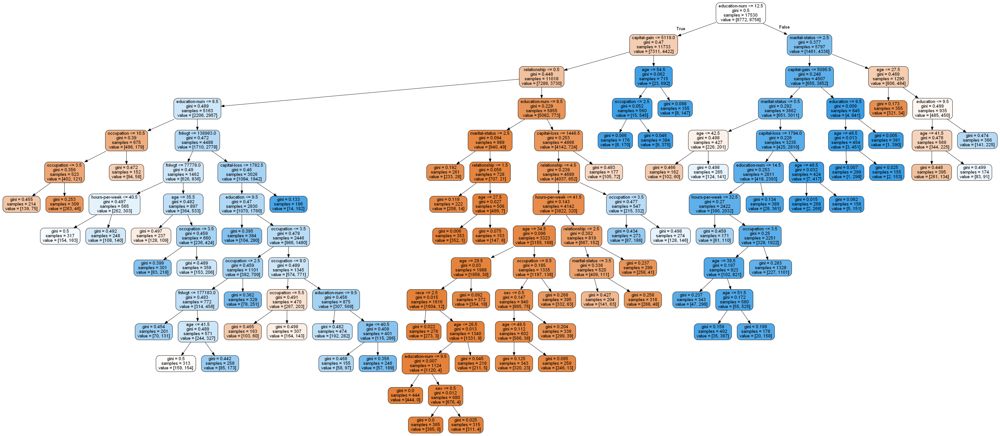

In [55]:
plt.clf()
image = plt.imread("census_undersampled.png")
height, width, depth = image.shape
dpi = 70
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize).add_axes([0, 0, 1, 1])
plt.axis('off')
plt.imshow(image)
plt.show()

In [49]:
print("Rendimiento en el conjunto de entrenamiento: ",undersampled_tree.score(X_train,y_train))
print("Rendimiento en el conjunto de prueba: ",undersampled_tree.score(X_test,y_test))
print("Rendimiento en el conjunto total: ",undersampled_tree.score(X,y))

Rendimiento en el conjunto de entrenamiento:  0.8011979463776383
Rendimiento en el conjunto de prueba:  0.8004791238877481
Rendimiento en el conjunto total:  0.8010182253786258


<Figure size 640x480 with 0 Axes>

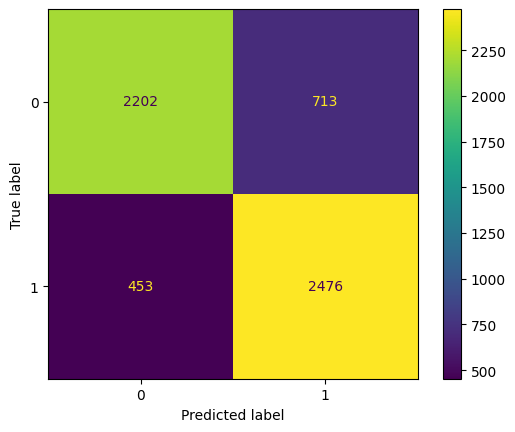

In [51]:
plt.clf()
pred3 = undersampled_tree.predict(X_test)
cm = skm.confusion_matrix(y_test, pred3, labels=undersampled_tree.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=undersampled_tree.classes_)
disp.plot()
plt.grid(False)
plt.show()

Se puede apreciar que el score general de rendimiento bajó a un 80%. A pesar de esto, observando la matriz de confusión podemos ver que el árbol resultante de un dataset undersampleado predice mucho mejor los casos positivos que el anteriormente visto, dehecho, discrimina mejor los datos positivos que los negativos, lo que sugiere que efectivamente había un sesgo debido al imbalance de la data. Se puede intentar aplicar métodos de oversampleo o alguna otra estrategia de undersampling, buscando mejorar el score general del modelo manteniendo la correcta discriminación de casos positivos y negativos (en comparación al caso con sesgo por imbalance en la data), pero estos métodos aplican algoritmos de Machine Learning que no se han visto hasta ahora en la materia. 

Otra propuesta es la utilización de el grid search exhaustivo en lugar del random search, este se intentó realizar pero el tiempo de ejecución probó y los recursos necesarios probaron ser bastante elevados, por lo que se decidió utilizar el random search. Si se utiliza el exhaustive search se podría encontrar un conjunto de hiperparámetros que mejore el score del árbol undersampleado.